# Author and reference
Wu, G., Yion, W. T. G., Dang, K. L. N. Q., & Wu, Z. (2023). Physics-informed machine learning for MPC: Application to a batch crystallization process. Chemical Engineering Research and Design, 192, 556-569.

In [1]:

# Import all necessary packages

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
import math
import optuna
from sklearn import preprocessing


In [2]:
# Set up GPU accelerated training

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('using GPU:', torch.cuda.get_device_name()) if torch.cuda.is_available() else 'using cpu'

using GPU: NVIDIA RTX A5000


# Crystallization Simulation

In [3]:
"""
Simulating crystallization process (https://doi.org/10.1016/j.cherd.2023.02.048)
"""

def Csat(T):
    """
    The solubility model
    """
    Csat_value = -2.0282 + 3.6592e-1*T- 2.5618e-2*(T**2)+ (9.7964e-4) * T**3 -(2.1062e-5) * T**4 +(2.4309e-7) * T**5 - (1.18e-9) * T**6
    return Csat_value
def Crystallization_simulation(u0_0, u1_0, u2_0, u3_0, Cs_0, T_0,Tj, t_final,t_step):
    # specifying constant parameters

    Kg1 = 1.926e-2
    Kg2 = 2.58e4  
    Kg3 = 1.0
    Kv = 1
    R = 8.314
    Kn1 = 6.9e22
    Kn2 = 7.67e4
    Kn3 = 0.16
    rhoc = 1.4 

    U = 18.9*60 #3000
    A = 0.032
    mr = 0.56
    Cpr = 2198

    u0, u1, u2, u3, Cs, T, Tj = u0_0, u1_0, u2_0, u3_0, Cs_0, T_0,Tj
    u0_list = list()  
    u1_list = list()  
    u2_list = list()
    u3_list = list()
    Cs_list = list()
    T_list = list()
    u0_list.append(u0)
    u1_list.append(u1)
    u2_list.append(u2)
    u3_list.append(u3)
    Cs_list.append(Cs)
    T_list.append(T)
    for i in range(int(t_final / t_step)):
        S = Cs / Csat(T)
        B = Kn1 * np.exp(-Kn2/(R*(T+273.15))) * np.exp(-Kn3/(np.log(S))**2)
        G = Kg1 * np.exp(-Kg2/(R*(T+273.15))) * (Csat(T)*(S-1))**Kg3
        du0dt = B
        du1dt = 1 * G* u0
        du2dt = 2 * G* u1
        du3dt = 3 * G* u2
        dCsdt = -3* rhoc * Kv * G  * u2
        dTdt = U*A*(Tj-T)/(mr*Cpr)

        u0 = u0 + du0dt*t_step
        u1 = u1 + du1dt*t_step   
        u2 = u2 + du2dt*t_step
        u3 = u3 + du3dt*t_step
        Cs = Cs + dCsdt*t_step
        T = T   + dTdt*t_step
        u0_list.append(u0)
        u1_list.append(u1)
        u2_list.append(u2)
        u3_list.append(u3)
        Cs_list.append(Cs)
        T_list.append(T)

    return u0_list, u1_list, u2_list, u3_list, Cs_list, T_list

t_final = 30    # sampling period
t_step  = 0.3   # integration time step


# Data generation PIRNN collocation points

In [3]:

def One_period_simulation(state_input):
    """
    stste_output shape: (sample,6)
    """
    # Generate list to save RNN input and output
    u0_output = list()
    u1_output = list()
    u2_output = list()
    u3_output = list()
    Cs_output = list()
    T_output = list()

    u0_input = list()
    u1_input = list()
    u2_input = list()
    u3_input = list()
    Cs_input = list()
    T_input = list()
    Tj_input = list()

    next_u0_input= list()
    next_u1_input= list()
    next_u2_input= list()
    next_u3_input= list()
    next_Cs_input= list()
    next_T_input= list()
    
    for i in range(len(state_input[:,0])):
        u_0_initial = state_input[i,0]
        u_1_initial = state_input[i,1]
        u_2_initial = state_input[i,2]
        u_3_initial = state_input[i,3]
        C_s_initial = state_input[i,4]
        T_0_initial = state_input[i,5]
        if T_0_initial > 40:
            Tj = np.array(np.random.randint(15,40))
        elif 30< T_0_initial <= 40:
            Tj = np.array(np.random.randint(15,40))             
        elif 17 < T_0_initial <= 30:
            Tj = np.array(np.random.randint(15,35))         
        elif T_0_initial <=17:
            Tj = np.array(np.random.randint(15,30))
        
        Tj_input.append(Tj)
        u0_input.append(u_0_initial)
        u1_input.append(u_1_initial)
        u2_input.append(u_2_initial)
        u3_input.append(u_3_initial)
        Cs_input.append(C_s_initial)
        T_input.append(T_0_initial)

        u0_list, u1_list, u2_list, u3_list, Cs_list, T_list \
            =Crystallization_simulation(u_0_initial,u_1_initial,u_2_initial,u_3_initial,C_s_initial,T_0_initial,Tj,t_final,t_step)    ## Open-loop simulations of the first-principles model of Crystallization                   
        
        for i  in range(len(u0_list)):
            if i % 10 == 0:    #change manual
                u0_output.append(u0_list[i]) 
                u1_output.append(u1_list[i]) 
                u2_output.append(u2_list[i])
                u3_output.append(u3_list[i]) 
                Cs_output.append(Cs_list[i])
                T_output.append(T_list[i]) 
        
        next_u0_input.append(u0_list[-1])
        next_u1_input.append(u1_list[-1])
        next_u2_input.append(u2_list[-1])
        next_u3_input.append(u3_list[-1])
        next_Cs_input.append(Cs_list[-1])
        next_T_input.append(T_list[-1])
    
    next_u0_input = np.array(next_u0_input)
    next_u0_input = next_u0_input.reshape(-1,1)

    next_u1_input = np.array(next_u1_input)
    next_u1_input = next_u1_input.reshape(-1,1)

    next_u2_input = np.array(next_u2_input)
    next_u2_input = next_u2_input.reshape(-1,1)

    next_u3_input = np.array(next_u3_input)
    next_u3_input = next_u3_input.reshape(-1,1)

    next_Cs_input = np.array(next_Cs_input)
    next_Cs_input = next_Cs_input.reshape(-1,1) 

    next_T_input = np.array(next_T_input)
    next_T_input = next_T_input.reshape(-1,1)
    next_state_input = np.concatenate((next_u0_input, next_u1_input, next_u2_input,next_u3_input, next_Cs_input, next_T_input), axis=1)
    
    # collate iutput for RNN
    '''
    RNN input shape is (number of samples, time steps=11, number of input variables=7)
    '''
    u0_input = np.array(u0_input)
    u0_input = u0_input.reshape(-1,1,1)

    u1_input = np.array(u1_input)
    u1_input = u1_input.reshape(-1,1,1)

    u2_input = np.array(u2_input)
    u2_input = u2_input.reshape(-1,1,1)

    u3_input = np.array(u3_input)
    u3_input = u3_input.reshape(-1,1,1)

    Cs_input = np.array(Cs_input)
    Cs_input = Cs_input.reshape(-1,1,1)

    T_input = np.array(T_input)
    T_input = T_input.reshape(-1,1,1)

    Tj_input = np.array(Tj_input)
    Tj_input = Tj_input.reshape(-1,1,1)

    RNN_input = np.concatenate((u0_input, u1_input, u2_input,u3_input,Cs_input, T_input,Tj_input), axis=2)
    RNN_input = RNN_input.repeat(11, axis=1)     
    
    # collate output for RNN
    '''
    RNN output shape is (number of samples, time steps=11, number of input variables=6)
    '''    
    u0_output = np.array(u0_output)
    u0_output = u0_output.reshape(-1, 11, 1) 
    
    u1_output = np.array(u1_output)
    u1_output = u1_output.reshape(-1, 11, 1)
    
    u2_output = np.array(u2_output)
    u2_output = u2_output.reshape(-1, 11, 1)
    
    u3_output = np.array(u3_output)
    u3_output = u3_output.reshape(-1, 11, 1)
    
    Cs_output = np.array(Cs_output)
    Cs_output = Cs_output.reshape(-1, 11, 1)
    
    T_output = np.array(T_output)
    T_output = T_output.reshape(-1, 11, 1)
    RNN_output = np.concatenate((u0_output,u1_output,u2_output,u3_output,Cs_output, T_output), axis=2)
    
    return RNN_input, RNN_output , next_state_input


In [10]:
# get X and y data for training and testing
'''
generating manipulated inputs and initial states for open-loop simulation
'''
T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
u_initial = np.zeros([1,4])
Cs_initial = np.ceil(100*Csat(T_initial))/100
state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
print(state_input)

RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
RNN_input1 = RNN_input_period
RNN_output1 = RNN_output_period
for j in range(30000):    
    T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
    u_initial = np.zeros([1,4])
    Cs_initial = np.ceil(100*Csat(T_initial))/100
    state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
    RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
    RNN_input_in = RNN_input_period
    RNN_output_in = RNN_output_period    
    for i in range(19):
        RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
        # print(RNN_input_period.shape)
        # print(RNN_output_period.shape)
        # print(state_input.shape)
        RNN_input_in = np.concatenate((RNN_input_in,RNN_input_period),axis=0)
        RNN_output_in = np.concatenate((RNN_output_in,RNN_output_period),axis=0)
    
    RNN_input1 = np.concatenate((RNN_input1,RNN_input_in),axis=0)
    RNN_output1 = np.concatenate((RNN_output1,RNN_output_in),axis=0)
print("RNN_input1 shape is {}".format(RNN_input1.shape))
print("RNN_output1 shape is {}".format(RNN_output1.shape))

np.save('RNN_input1.npy',RNN_input1)
np.save('RNN_output1.npy',RNN_output1)

[[ 0.    0.    0.    0.    0.56 48.  ]]
RNN_input1 shape is (600001, 11, 7)
RNN_output1 shape is (600001, 11, 6)


In [11]:
# get X and y data for training and testing
T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
u_initial = np.zeros([1,4])
Cs_initial = np.ceil(100*Csat(T_initial))/100
state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
print(state_input)

RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
RNN_input2 = RNN_input_period
RNN_output2 = RNN_output_period
for j in range(30000):    
    T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
    u_initial = np.zeros([1,4])
    Cs_initial = np.ceil(100*Csat(T_initial))/100
    state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
    RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
    RNN_input_in = RNN_input_period
    RNN_output_in = RNN_output_period    
    for i in range(19):
        RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
        # print(RNN_input_period.shape)
        # print(RNN_output_period.shape)
        # print(state_input.shape)
        RNN_input_in = np.concatenate((RNN_input_in,RNN_input_period),axis=0)
        RNN_output_in = np.concatenate((RNN_output_in,RNN_output_period),axis=0)
    
    RNN_input2 = np.concatenate((RNN_input2,RNN_input_in),axis=0)
    RNN_output2 = np.concatenate((RNN_output2,RNN_output_in),axis=0)
print("RNN_input2 shape is {}".format(RNN_input2.shape))
print("RNN_output2 shape is {}".format(RNN_output2.shape))

np.save('RNN_input2.npy',RNN_input2)
np.save('RNN_output2.npy',RNN_output2)

[[ 0.    0.    0.    0.    0.56 48.  ]]
RNN_input2 shape is (600001, 11, 7)
RNN_output2 shape is (600001, 11, 6)


In [12]:
# get X and y data for training and testing
T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
u_initial = np.zeros([1,4])
Cs_initial = np.ceil(100*Csat(T_initial))/100
state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
print(state_input)

RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
RNN_input3 = RNN_input_period
RNN_output3 = RNN_output_period
for j in range(30000):    
    T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
    u_initial = np.zeros([1,4])
    Cs_initial = np.ceil(100*Csat(T_initial))/100
    state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
    RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
    RNN_input_in = RNN_input_period
    RNN_output_in = RNN_output_period    
    for i in range(19):
        RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
        # print(RNN_input_period.shape)
        # print(RNN_output_period.shape)
        # print(state_input.shape)
        RNN_input_in = np.concatenate((RNN_input_in,RNN_input_period),axis=0)
        RNN_output_in = np.concatenate((RNN_output_in,RNN_output_period),axis=0)
    
    RNN_input3 = np.concatenate((RNN_input3,RNN_input_in),axis=0)
    RNN_output3 = np.concatenate((RNN_output3,RNN_output_in),axis=0)
print("RNN_input3 shape is {}".format(RNN_input3.shape))
print("RNN_output3 shape is {}".format(RNN_output3.shape))

np.save('RNN_input3.npy',RNN_input3)
np.save('RNN_output3.npy',RNN_output3)

[[ 0.    0.    0.    0.    0.56 48.  ]]
RNN_input3 shape is (600001, 11, 7)
RNN_output3 shape is (600001, 11, 6)


In [13]:
# get X and y data for training and testing
T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
u_initial = np.zeros([1,4])
Cs_initial = np.ceil(100*Csat(T_initial))/100
state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
print(state_input)

RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
RNN_input4 = RNN_input_period
RNN_output4 = RNN_output_period
for j in range(30000):    
    T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
    u_initial = np.zeros([1,4])
    Cs_initial = np.ceil(100*Csat(T_initial))/100
    state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
    RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
    RNN_input_in = RNN_input_period
    RNN_output_in = RNN_output_period    
    for i in range(19):
        RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
        # print(RNN_input_period.shape)
        # print(RNN_output_period.shape)
        # print(state_input.shape)
        RNN_input_in = np.concatenate((RNN_input_in,RNN_input_period),axis=0)
        RNN_output_in = np.concatenate((RNN_output_in,RNN_output_period),axis=0)
    
    RNN_input4 = np.concatenate((RNN_input4,RNN_input_in),axis=0)
    RNN_output4 = np.concatenate((RNN_output4,RNN_output_in),axis=0)
print("RNN_input4 shape is {}".format(RNN_input4.shape))
print("RNN_output4 shape is {}".format(RNN_output4.shape))

np.save('RNN_input4.npy',RNN_input4)
np.save('RNN_output4.npy',RNN_output4)

[[ 0.    0.    0.    0.    0.56 48.  ]]
RNN_input4 shape is (600001, 11, 7)
RNN_output4 shape is (600001, 11, 6)


In [14]:
# get X and y data for training and testing
T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
u_initial = np.zeros([1,4])
Cs_initial = np.ceil(100*Csat(T_initial))/100
state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
print(state_input)

RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
RNN_input5 = RNN_input_period
RNN_output5 = RNN_output_period
for j in range(30000):    
    T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
    u_initial = np.zeros([1,4])
    Cs_initial = np.ceil(100*Csat(T_initial))/100
    state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
    RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
    RNN_input_in = RNN_input_period
    RNN_output_in = RNN_output_period    
    for i in range(19):
        RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
        # print(RNN_input_period.shape)
        # print(RNN_output_period.shape)
        # print(state_input.shape)
        RNN_input_in = np.concatenate((RNN_input_in,RNN_input_period),axis=0)
        RNN_output_in = np.concatenate((RNN_output_in,RNN_output_period),axis=0)
    
    RNN_input5 = np.concatenate((RNN_input5,RNN_input_in),axis=0)
    RNN_output5 = np.concatenate((RNN_output5,RNN_output_in),axis=0)
print("RNN_input5 shape is {}".format(RNN_input5.shape))
print("RNN_output5 shape is {}".format(RNN_output5.shape))

np.save('RNN_input5.npy',RNN_input5)
np.save('RNN_output5.npy',RNN_output5)

[[ 0.    0.    0.    0.    0.56 48.  ]]
RNN_input5 shape is (600001, 11, 7)
RNN_output5 shape is (600001, 11, 6)


In [15]:
# get X and y data for training and testing
T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
u_initial = np.zeros([1,4])
Cs_initial = np.ceil(100*Csat(T_initial))/100
state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
print(state_input)

RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
RNN_input6 = RNN_input_period
RNN_output6 = RNN_output_period
for j in range(30000):    
    T_initial = np.linspace(48, 55, 1, endpoint=True).reshape(-1,1)  
    u_initial = np.zeros([1,4])
    Cs_initial = np.ceil(100*Csat(T_initial))/100
    state_input = np.concatenate((u_initial,Cs_initial,T_initial), axis=1)
    RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
    RNN_input_in = RNN_input_period
    RNN_output_in = RNN_output_period    
    for i in range(19):
        RNN_input_period, RNN_output_period , state_input = One_period_simulation(state_input)
        # print(RNN_input_period.shape)
        # print(RNN_output_period.shape)
        # print(state_input.shape)
        RNN_input_in = np.concatenate((RNN_input_in,RNN_input_period),axis=0)
        RNN_output_in = np.concatenate((RNN_output_in,RNN_output_period),axis=0)
    
    RNN_input6 = np.concatenate((RNN_input6,RNN_input_in),axis=0)
    RNN_output6 = np.concatenate((RNN_output6,RNN_output_in),axis=0)
print("RNN_input6 shape is {}".format(RNN_input6.shape))
print("RNN_output6 shape is {}".format(RNN_output6.shape))

np.save('RNN_input6.npy',RNN_input6)
np.save('RNN_output6.npy',RNN_output6)

[[ 0.    0.    0.    0.    0.56 48.  ]]
RNN_input6 shape is (600001, 11, 7)
RNN_output6 shape is (600001, 11, 6)


In [16]:
RNN_input = np.concatenate((RNN_input1,RNN_input2,RNN_input3,RNN_input4,RNN_input5,RNN_input6),axis=0)
RNN_output = np.concatenate((RNN_output1,RNN_output2,RNN_output3,RNN_output4,RNN_output5,RNN_output6),axis=0)

In [17]:
print("RNN_input shape is {}".format(RNN_input.shape))
print("RNN_output shape is {}".format(RNN_output.shape))

RNN_input shape is (3600006, 11, 7)
RNN_output shape is (3600006, 11, 6)


In [18]:
# checking the input is duplicated tf/tstep times for each time step
print(RNN_input[0, 0])
print(RNN_input[0, 1])

[ 0.    0.    0.    0.    0.56 48.   21.  ]
[ 0.    0.    0.    0.    0.56 48.   21.  ]


In [21]:
'''
Using standardization to transform the original data to a new distribution with mean=0 and standard deviation=1.
'''

scaler_X = preprocessing.StandardScaler().fit(RNN_input.reshape(-1, 7)) #7 number of input variable
scaler_y = preprocessing.StandardScaler().fit(RNN_output.reshape(-1, 6)) #6 number of output variable

print(scaler_X.mean_)
print(scaler_X.var_)
print(scaler_y.mean_)
print(scaler_y.var_)

RNN_input = scaler_X.transform(RNN_input.reshape(-1, 7)).reshape(-1,11,7)
RNN_output = scaler_y.transform(RNN_output.reshape(-1, 6)).reshape(-1,11,6)

# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(RNN_input, RNN_output, test_size=0.1, random_state=123)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=123)

print(f"X_train shape is {X_train.shape},  X_test shape is {X_test.shape}")
print(f"y_train shape is {y_train.shape},  y_test shape is {y_test.shape}")

mean_y = torch.from_numpy(scaler_y.mean_).float()
std_y = torch.from_numpy(np.sqrt(scaler_y.var_)).float()


[4.67401203e+11 1.32929460e+07 5.57120541e+02 2.76403959e-02
 5.21303446e-01 2.70098945e+01 2.50328205e+01]
[8.36649015e+22 1.39144183e+14 3.65491977e+05 1.18700347e-03
 2.32652680e-03 4.62104713e+01 3.84321915e+01]
[4.89990332e+11 1.42056647e+07 6.06052469e+02 3.05858619e-02
 5.17179793e-01 2.63514318e+01]
[8.25725166e+22 1.47527049e+14 4.04859640e+05 1.36494834e-03
 2.67529875e-03 3.00035671e+01]
X_train shape is (2916004, 11, 7),  X_test shape is (360001, 11, 7)
y_train shape is (2916004, 11, 6),  y_test shape is (360001, 11, 6)


In [22]:
# checking the input is duplicated tf/tstep times for each time step
print(X_train[0, 0])
print(X_train[0, 1])
# checking output
print(y_train[0, :,:])

[-6.42968750e-01 -8.17188271e-01 -8.20647449e-01 -7.69805558e-01
  7.69805558e-01  5.08964675e-04  8.01239367e-01]
[-6.42968750e-01 -8.17188271e-01 -8.20647449e-01 -7.69805558e-01
  7.69805558e-01  5.08964675e-04  8.01239367e-01]
[[-0.72581853 -0.86877655 -0.85663075 -0.79760042  0.79760042  0.12084278]
 [-0.70396555 -0.85731444 -0.85091006 -0.79511001  0.79511001  0.16719232]
 [-0.68183321 -0.84562803 -0.84498855 -0.79247939  0.79247939  0.20960189]
 [-0.65945345 -0.83371545 -0.83886311 -0.78970421  0.78970421  0.2484064 ]
 [-0.63685522 -0.82157507 -0.8325305  -0.78678004  0.78678004  0.28391231]
 [-0.61406471 -0.80920543 -0.82598743 -0.78370233  0.78370233  0.31640001]
 [-0.5911055  -0.79660526 -0.81923054 -0.7804665   0.7804665   0.34612607]
 [-0.56799882 -0.7837735  -0.81225642 -0.77706785  0.77706785  0.37332524]
 [-0.54476371 -0.77070923 -0.80506161 -0.77350162  0.77350162  0.39821233]
 [-0.52141728 -0.75741171 -0.79764265 -0.76976298  0.76976298  0.42098387]
 [-0.49797485 -0.743

In [23]:
'''
Convert data to torch format
'''

X_physics_train = torch.from_numpy(X_train).float()

X_physics_val = torch.from_numpy(X_val).float()

X_physics_test = torch.from_numpy(X_test).float()

y_physics_train = torch.from_numpy(y_train).float() #y_physics_train normalize

y_physics_val = torch.from_numpy(y_val).float()# y_physics_train normalize

y_physics_test = torch.from_numpy(y_test).float() #y_physics_test normalize


print(f'X_physics_train shape is: {X_physics_train.shape}')
print(f'y_physics_train shape is: {y_physics_train.shape}')
print(f'X_physics_val shape is: {X_physics_val.shape}')
print(f'y_physics_val shape is: {y_physics_val.shape}')
print(f'X_physics_test shape is: {X_physics_test.shape}')
print(f'y_physics_test shape is: {y_physics_test.shape}')

X_physics_train shape is: torch.Size([2916004, 11, 7])
y_physics_train shape is: torch.Size([2916004, 11, 6])
X_physics_val shape is: torch.Size([324001, 11, 7])
y_physics_val shape is: torch.Size([324001, 11, 6])
X_physics_test shape is: torch.Size([360001, 11, 7])
y_physics_test shape is: torch.Size([360001, 11, 6])


In [24]:
'''
Creating data loaders for training, validation, and testing datasets
'''
dataset_physics_train = TensorDataset(X_physics_train,y_physics_train)
dataloader_physics_train = DataLoader(dataset_physics_train, batch_size=1024, shuffle=True)

dataset_physics_val = TensorDataset(X_physics_val,y_physics_val)
dataloader_physics_val = DataLoader(dataset_physics_val, batch_size=1024, shuffle=True)

dataset_physics_test = TensorDataset(X_physics_test,y_physics_test)
dataloader_physics_test = DataLoader(dataset_physics_test, batch_size=1, shuffle=False)

In [25]:
'''
Save data loaders of training, validation, and testing datasets
'''
torch.save(dataloader_physics_train,'dataloader_physics_train.pt')
torch.save(dataloader_physics_val,'dataloader_physics_val.pt')
torch.save(dataloader_physics_test,'dataloader_physics_test.pt')

torch.save(mean_y,'mean_y.pt')
torch.save(std_y,'std_y.pt')
np.save('mean_X.npy',scaler_X.mean_)
np.save('std_X.npy',np.sqrt(scaler_X.var_))


In [3]:
mean_X = np.load('mean_X.npy')
std_X = np.load('std_X.npy')


In [4]:
dataloader_physics_train = torch.load('dataloader_physics_train.pt')
dataloader_physics_val = torch.load('dataloader_physics_val.pt')
dataloader_physics_test = torch.load('dataloader_physics_test.pt')
mean_y = torch.load('mean_y.pt')
std_y=torch.load('std_y.pt')


# Defing RNN

In [5]:
class RNN(nn.Module):
    "Defines a RNN network"
    
    def __init__(self, N_INPUT, N_OUTPUT, N_HIDDEN, N_LAYERS):
        super(RNN, self).__init__()
        self.layers = N_LAYERS
        
        if isinstance(N_HIDDEN, list):
            self.rnn = nn.LSTM(N_INPUT, 
                                N_HIDDEN[0], 
                                batch_first=True)
            
            self.rnn1 = nn.ModuleList(
                [nn.LSTM(N_HIDDEN[i], 
                        N_HIDDEN[i+1],
                       batch_first=True) for i in range(N_LAYERS - 1)]
            )
            
            self.output_layer = nn.Linear(N_HIDDEN[-1], N_OUTPUT)
            
            self.list_flag = True
            
        else:
            self.rnn = nn.LSTM(N_INPUT, 
                                N_HIDDEN,
                                N_LAYERS,
                                batch_first=True,
                                dropout=0.1)
            
            self.output_layer = nn.Linear(N_HIDDEN, N_OUTPUT)
            
            self.list_flag = False                                             
        
    def forward(self, x):
        x, _ = self.rnn(x)
        
        if self.list_flag:
            for i in range(self.layers - 1):
                x, _ = self.rnn1[i](x)
                
        x = self.output_layer(x)
        return x

# Physics-informed RNN

## Train and valid PIRNN

In [7]:
def train_model(model,n_epochs):

    # to track the training loss as the model trains
    train_losses = []
    # to track the validation loss as the model trains
    valid_losses = []
    # to track the average training loss per epoch as the model trains
    avg_train_losses = []
    # to track the average validation loss per epoch as the model trains
    avg_valid_losses = [] 
 
    for epoch in range(1,n_epochs+1):
        ###################
        # train the model #
        ###################
        model.train() # prep model for training 

        for id_batch, (x_batch, y_batch) in enumerate(dataloader_physics_train):
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()

        
            NN_output = model_PINN(x_batch) # the predicted values x̃ are obtained by passing the input vector to the PIRNN model

            # Compute the loss term corresponding to initial conditions
            loss1 = torch.mean((NN_output[:, 0, :] - y_batch[:, 0, :])**2)  # use mean squared error
            # Compute the data-driven loss term
            lossCs = torch.mean((NN_output[:, 1:, 4] - y_batch[:, 1:, 4])**2)
            lossTr = torch.mean((NN_output[:, 1:, 5] - y_batch[:, 1:, 5])**2)

            # convert to original scale
            NN_output = NN_output * std_y.to(device) + mean_y.to(device) 
            Tj  = x_batch[:, :, 6] * std_X[6] + mean_X[6]

            # Compute the derivative of predictive states by finite difference method 
            du0_first = (NN_output[:, 1:2, 0] - NN_output[:, 0:1, 0]) / (t_step*10)
            du1_first = (NN_output[:, 1:2, 1] - NN_output[:, 0:1, 1]) / (t_step*10)
            du2_first = (NN_output[:, 1:2, 2] - NN_output[:, 0:1, 2]) / (t_step*10)
            du3_first = (NN_output[:, 1:2, 3] - NN_output[:, 0:1, 3]) / (t_step*10)


            du0_center = (NN_output[:, 2:, 0] - NN_output[:, :-2, 0]) / (2 * t_step*10)
            du1_center = (NN_output[:, 2:, 1] - NN_output[:, :-2, 1]) / (2 * t_step*10)
            du2_center = (NN_output[:, 2:, 2] - NN_output[:, :-2, 2]) / (2 * t_step*10)
            du3_center = (NN_output[:, 2:, 3] - NN_output[:, :-2, 3]) / (2 * t_step*10)

            du0_last = (NN_output[:, -1:, 0] - NN_output[:, -2:-1, 0]) / (t_step*10)
            du1_last = (NN_output[:, -1:, 1] - NN_output[:, -2:-1, 1]) / (t_step*10)
            du2_last = (NN_output[:, -1:, 2] - NN_output[:, -2:-1, 2]) / (t_step*10)
            du3_last = (NN_output[:, -1:, 3] - NN_output[:, -2:-1, 3]) / (t_step*10)

            du0 = torch.cat((du0_first, du0_center, du0_last), 1)
            du1 = torch.cat((du1_first, du1_center, du1_last), 1)
            du2 = torch.cat((du2_first, du2_center, du2_last), 1)
            du3 = torch.cat((du3_first, du3_center, du3_last), 1)


            Kg1 = 1.926e-2
            Kg2 = 2.58e4  
            Kg3 = 1.0
            Kv = 1
            R = 8.314
            Kn1 = 6.9e22
            Kn2 = 7.67e4
            Kn3 = 0.16
            rhoc = 1.4 
            U = 18.9*60 #3000
            A = 0.032
            mr = 0.56
            Cpr = 2198
            S = NN_output[:, :, 4] / Csat(NN_output[:, :, 5])
            B = Kn1 * torch.exp(-Kn2/(R*(NN_output[:, :, 5]+273.15))) * torch.exp(-Kn3/(torch.log(S))**2)
            G = Kg1 * torch.exp(-Kg2/(R*(NN_output[:, :, 5]+273.15))) * (Csat(NN_output[:, :, 5])*(S-1))**Kg3

            # Compute the physics-based loss terms of different states                
            loss2 = du0 - B
            loss2 = torch.mean(loss2**2)

            loss3 = du1 - 1 * G* NN_output[:, :, 0]
            loss3 = torch.mean(loss3**2)

            loss4 = du2 -  2 * G* NN_output[:, :, 1]
            loss4 = torch.mean(loss4**2)

            loss5 = du3 -  3 * G* NN_output[:, :, 2]
            loss5 = torch.mean(loss5**2)


            # backpropagate joint loss
            loss =  loss1 +1e-18*loss2+ 1e-9*loss3+ 1e-1 *loss4 + 1e6*loss5 + lossCs +lossTr  # add all loss terms together

            loss.backward()
            optimizer.step()
            # record training loss
            train_losses.append(loss.item())
      
        ######################    
        # validate the model #
        ######################
        model.eval() # prep model for evaluation   
        for val_batch,(x_valbatch, y_valbatch) in enumerate(dataloader_physics_val):
            x_valbatch, y_valbatch = x_valbatch.to(device), y_valbatch.to(device)  # use valiadation data   
            NN_output = model_PINN(x_valbatch)
            
            loss1 = torch.mean((NN_output[:, 0, :] - y_valbatch[:, 0, :])**2)  
            lossCs = torch.mean((NN_output[:, 1:, 4] - y_valbatch[:, 1:, 4])**2)
            lossTr = torch.mean((NN_output[:, 1:, 5] - y_valbatch[:, 1:, 5])**2)
            
            NN_output = NN_output * std_y.to(device) + mean_y.to(device)
            
            Tj  = x_valbatch[:, :, 6] * std_X[6] + mean_X[6]

            du0_first = (NN_output[:, 1:2, 0] - NN_output[:, 0:1, 0]) / (t_step*10)
            du1_first = (NN_output[:, 1:2, 1] - NN_output[:, 0:1, 1]) / (t_step*10)
            du2_first = (NN_output[:, 1:2, 2] - NN_output[:, 0:1, 2]) / (t_step*10)
            du3_first = (NN_output[:, 1:2, 3] - NN_output[:, 0:1, 3]) / (t_step*10)

            du0_center = (NN_output[:, 2:, 0] - NN_output[:, :-2, 0]) / (2 * t_step*10)
            du1_center = (NN_output[:, 2:, 1] - NN_output[:, :-2, 1]) / (2 * t_step*10)
            du2_center = (NN_output[:, 2:, 2] - NN_output[:, :-2, 2]) / (2 * t_step*10)
            du3_center = (NN_output[:, 2:, 3] - NN_output[:, :-2, 3]) / (2 * t_step*10)

            du0_last = (NN_output[:, -1:, 0] - NN_output[:, -2:-1, 0]) / (t_step*10)
            du1_last = (NN_output[:, -1:, 1] - NN_output[:, -2:-1, 1]) / (t_step*10)
            du2_last = (NN_output[:, -1:, 2] - NN_output[:, -2:-1, 2]) / (t_step*10)
            du3_last = (NN_output[:, -1:, 3] - NN_output[:, -2:-1, 3]) / (t_step*10)


            du0 = torch.cat((du0_first, du0_center, du0_last), 1)
            du1 = torch.cat((du1_first, du1_center, du1_last), 1)
            du2 = torch.cat((du2_first, du2_center, du2_last), 1)
            du3 = torch.cat((du3_first, du3_center, du3_last), 1)


            Kg1 = 1.926e-2
            Kg2 = 2.58e4  
            Kg3 = 1.0
            Kv = 1
            R = 8.314
            Kn1 = 6.9e22
            Kn2 = 7.67e4
            Kn3 = 0.16
            rhoc = 1.4 
            U = 18.9*60 
            A = 0.032
            mr = 0.56
            Cpr = 2198
            S = NN_output[:, :, 4] / Csat(NN_output[:, :, 5])
            B = Kn1 * torch.exp(-Kn2/(R*(NN_output[:, :, 5]+273.15))) * torch.exp(-Kn3/(torch.log(S))**2)
            G = Kg1 * torch.exp(-Kg2/(R*(NN_output[:, :, 5]+273.15))) * (Csat(NN_output[:, :, 5])*(S-1))**Kg3
                
            loss2 = du0 - B
            loss2 = torch.mean(loss2**2)

            loss3 = du1 - 1 * G* NN_output[:, :, 0]
            loss3 = torch.mean(loss3**2)

            loss4 = du2 -  2 * G* NN_output[:, :, 1]
            loss4 = torch.mean(loss4**2)

            loss5 = du3 -  3 * G* NN_output[:, :, 2]
            loss5 = torch.mean(loss5**2)

            # backpropagate joint loss

            loss =  loss1 +1e-18*loss2+ 1e-9*loss3+ 1e-1 *loss4 + 1e6*loss5 + lossCs +lossTr  # add all loss terms together

            valid_losses.append(loss.item())      
        
        # print training/validation statistics 
        # calculate average loss over an epoch
        train_loss = np.average(train_losses)
        valid_loss = np.average(valid_losses)
        avg_train_losses.append(train_loss)
        avg_valid_losses.append(valid_loss)
        
        epoch_len = len(str(n_epochs))
        
        print_msg = (f'[{epoch}/{n_epochs}] ' +
                     f'train_loss: {train_loss:.5f} ' +
                     f'valid_loss: {valid_loss:.5f}')
        
        print(print_msg)
        # clear lists to track next epoch
        train_losses = []
        valid_losses = []      
          
    return  model, avg_train_losses, avg_valid_losses

In [ ]:
# Train the PIRNN model
model_PINN = RNN(7, 6, [512 ,256, 128], 3)
model_PINN.to(device)
print(model_PINN)

optimizer = torch.optim.Adam(model_PINN.parameters(),lr=1e-3)
n_epochs = 100
model, train_loss, valid_loss = train_model(model_PINN, n_epochs)


In [9]:
torch.save(model_PINN,'PINN_lossnormal1.pkl')

## Test PIRNN

In [8]:
"""
Test PIRNN model
"""
model_PINN = torch.load('PINN_lossnormal1.pkl')
model_PINN.to(device)
print(model_PINN)

y_test_error = list()

total_batch_num = 360001 # change manual. sample of test data

for id_batch, (x_batch, y_batch) in enumerate(dataloader_physics_test):
    model_PINN.eval()    
    x_batch, y_batch = x_batch.to(device), y_batch.to(device)

    print(f"{id_batch} out of {total_batch_num}")
    # compute the "data loss"
    NN_output = model_PINN(x_batch)

    loss1 = torch.mean((NN_output[:, 0, :] - y_batch[:, 0, :])**2)  # use mean squared error
    lossCs = torch.mean((NN_output[:, 1:, 4] - y_batch[:, 1:, 4])**2)
    lossTr = torch.mean((NN_output[:, 1:, 5] - y_batch[:, 1:, 5])**2)
    
    NN_output = NN_output * std_y.to(device) + mean_y.to(device)

    # compute the derivative of different states

    Tj  = x_batch[:, :, 6] * std_X[6] + mean_X[6]

    du0_first = (NN_output[:, 1:2, 0] - NN_output[:, 0:1, 0]) / (t_step*10)
    du1_first = (NN_output[:, 1:2, 1] - NN_output[:, 0:1, 1]) / (t_step*10)
    du2_first = (NN_output[:, 1:2, 2] - NN_output[:, 0:1, 2]) / (t_step*10)
    du3_first = (NN_output[:, 1:2, 3] - NN_output[:, 0:1, 3]) / (t_step*10)


    du0_center = (NN_output[:, 2:, 0] - NN_output[:, :-2, 0]) / (2 * t_step*10)
    du1_center = (NN_output[:, 2:, 1] - NN_output[:, :-2, 1]) / (2 * t_step*10)
    du2_center = (NN_output[:, 2:, 2] - NN_output[:, :-2, 2]) / (2 * t_step*10)
    du3_center = (NN_output[:, 2:, 3] - NN_output[:, :-2, 3]) / (2 * t_step*10)

    du0_last = (NN_output[:, -1:, 0] - NN_output[:, -2:-1, 0]) / (t_step*10)
    du1_last = (NN_output[:, -1:, 1] - NN_output[:, -2:-1, 1]) / (t_step*10)
    du2_last = (NN_output[:, -1:, 2] - NN_output[:, -2:-1, 2]) / (t_step*10)
    du3_last = (NN_output[:, -1:, 3] - NN_output[:, -2:-1, 3]) / (t_step*10)

    du0 = torch.cat((du0_first, du0_center, du0_last), 1)
    du1 = torch.cat((du1_first, du1_center, du1_last), 1)
    du2 = torch.cat((du2_first, du2_center, du2_last), 1)
    du3 = torch.cat((du3_first, du3_center, du3_last), 1)

    Kg1 = 1.926e-2
    Kg2 = 2.58e4  
    Kg3 = 1.0
    Kv = 1
    R = 8.314
    Kn1 = 6.9e22
    Kn2 = 7.67e4
    Kn3 = 0.16
    rhoc = 1.4 
    U = 18.9*60 #3000
    A = 0.032
    mr = 0.56
    Cpr = 2198
    S = NN_output[:, :, 4] / Csat(NN_output[:, :, 5])
    B = Kn1 * torch.exp(-Kn2/(R*(NN_output[:, :, 5]+273.15))) * torch.exp(-Kn3/(torch.log(S))**2)
    G = Kg1 * torch.exp(-Kg2/(R*(NN_output[:, :, 5]+273.15))) * (Csat(NN_output[:, :, 5])*(S-1))**Kg3

    # compute the "physics loss"        
    loss2 = du0 - B
    loss2 = torch.mean(loss2**2)

    loss3 = du1 - 1 * G* NN_output[:, :, 0]
    loss3 = torch.mean(loss3**2)

    loss4 = du2 -  2 * G* NN_output[:, :, 1]
    loss4 = torch.mean(loss4**2)

    loss5 = du3 -  3 * G* NN_output[:, :, 2]
    loss5 = torch.mean(loss5**2)

    # backpropagate joint loss

    loss =  loss1 +1e-18*loss2+ 1e-9*loss3+ 1e-1 *loss4 + 1e6*loss5 + lossCs +lossTr  # add all loss terms together

    y_test_error.append(loss.item())
    
print(f"mean error is {np.mean(y_test_error)}, std is {np.std(y_test_error)}")   

RNN(
  (rnn): LSTM(7, 512, batch_first=True)
  (rnn1): ModuleList(
    (0): LSTM(512, 256, batch_first=True)
    (1): LSTM(256, 128, batch_first=True)
  )
  (output_layer): Linear(in_features=128, out_features=6, bias=True)
)
0 out of 360001
1 out of 360001
2 out of 360001
3 out of 360001
4 out of 360001
5 out of 360001
6 out of 360001
7 out of 360001
8 out of 360001
9 out of 360001
10 out of 360001
11 out of 360001
12 out of 360001
13 out of 360001
14 out of 360001
15 out of 360001
16 out of 360001
17 out of 360001
18 out of 360001
19 out of 360001
20 out of 360001
21 out of 360001
22 out of 360001
23 out of 360001
24 out of 360001
25 out of 360001
26 out of 360001
27 out of 360001
28 out of 360001
29 out of 360001
30 out of 360001
31 out of 360001
32 out of 360001
33 out of 360001
34 out of 360001
35 out of 360001
36 out of 360001
37 out of 360001
38 out of 360001
39 out of 360001
40 out of 360001
41 out of 360001
42 out of 360001
43 out of 360001
44 out of 360001
45 out of 360001
46

In [9]:
print(f"Test mean error is {np.mean(y_test_error)}, std is {np.std(y_test_error)}")   

Test mean error is 0.00010401407806604644, std is 0.00010955861481827787


## Compare with the first principal model

RNN(
  (rnn): LSTM(7, 512, batch_first=True)
  (rnn1): ModuleList(
    (0): LSTM(512, 256, batch_first=True)
    (1): LSTM(256, 128, batch_first=True)
  )
  (output_layer): Linear(in_features=128, out_features=6, bias=True)
)


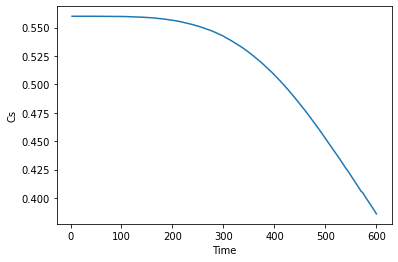

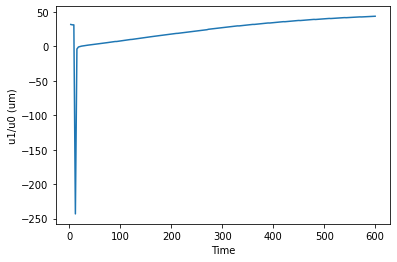

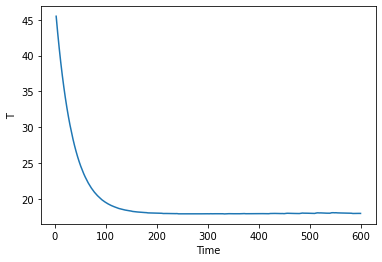

In [10]:
"""
Compare with the first principal model
"""
model_PINN = torch.load('PINN_lossnormal1.pkl')
model_PINN.eval()
model_PINN.to('cpu')
print(model_PINN)


u0_list = np.array([0.0]).reshape(1,1,-1)  
u1_list = np.array([0.0]).reshape(1,1,-1)  
u2_list = np.array([0.0]).reshape(1,1,-1)
u3_list = np.array([0.0]).reshape(1,1,-1)
Cs_list = np.array([0.56]).reshape(1,1,-1)
T_list = np.array([48]).reshape(1,1,-1)
Tj_list = np.array([18]).reshape(1,1,-1)

state_input = np.concatenate((u0_list, u1_list, u2_list,u3_list,Cs_list, T_list,Tj_list), axis=2)
state_input = state_input.repeat(11, axis=1)

state_input = (state_input - mean_X) / std_X

u0_record = list()
u1_record = list()
u2_record = list()
u3_record = list()
Cs_record = list()
T_record = list()

for i in range(20):

    state_input = torch.from_numpy(state_input).float()
    
    state_predict = model_PINN(state_input)

    state_predict = state_predict * std_y + mean_y


    state_predict = state_predict.detach().numpy()

    u0_record.append(state_predict[0, 1:, 0])
    u1_record.append(state_predict[0, 1:, 1])
    u2_record.append(state_predict[0, 1:, 2])
    u3_record.append(state_predict[0, 1:, 3])
    Cs_record.append(state_predict[0, 1:, 4])
    T_record.append(state_predict[0, 1:, 5])
    # print(state_predict[0, :, 4])

    u0_list = np.array([state_predict[0, :, 0][-1]]).reshape(1,1,-1) 
    u1_list = np.array([state_predict[0, :, 1][-1]]).reshape(1,1,-1)  
    u2_list = np.array([state_predict[0, :, 2][-1]]).reshape(1,1,-1)
    u3_list = np.array([state_predict[0, :, 3][-1]]).reshape(1,1,-1)
    Cs_list = np.array([state_predict[0, :, 4][-1]]).reshape(1,1,-1)
    T_list = np.array([state_predict[0, :, 5][-1]]).reshape(1,1,-1)
    
    state_input = np.concatenate((u0_list, u1_list, u2_list,u3_list,Cs_list, T_list,Tj_list), axis=2)

    state_input = state_input.repeat(11, axis=1)
    
    state_input = (state_input - mean_X) / std_X
    
 
    i = i+1

u0_record = np.array(u0_record).flatten()
u1_record = np.array(u1_record).flatten()
u2_record = np.array(u2_record).flatten()
u3_record = np.array(u3_record).flatten()
Cs_record = np.array(Cs_record).flatten()
T_record = np.array(T_record).flatten()

t = np.linspace(3, 600, 200)

# print(u0_record)
plt.figure()
plt.plot(t, Cs_record)
plt.ylabel('Cs')
plt.xlabel('Time')
plt.show()
# print(Cs_record)

plt.figure()
plt.plot(t, 1e6*u1_record/u0_record)
plt.ylabel('u1/u0 (um)')
plt.xlabel('Time')
plt.show()

plt.figure()
plt.plot(t, T_record)
plt.ylabel('T')
plt.xlabel('Time')
plt.show()


In [ ]:

""" 
Forward Euler method (First principal model)
"""

def Csat(T):
    Csat_value = -2.0282 + 3.6592e-1*T- 2.5618e-2*(T**2)+ (9.7964e-4) * T**3 -(2.1062e-5) * T**4 +(2.4309e-7) * T**5 - (1.18e-9) * T**6
    return Csat_value
def Crystallization_simulation(u0_0, u1_0, u2_0, u3_0, Cs_0, T_0,Tj, t_final,t_step):
    Kg1 = 1.926e-2
    Kg2 = 2.58e4  
    Kg3 = 1.0
    Kv = 1
    R = 8.314
    Kn1 = 6.9e22
    Kn2 = 7.67e4
    Kn3 = 0.16
    rhoc = 1.4 

    U = 18.9*60 
    A = 0.032
    mr = 0.56
    Cpr = 2198

    u0, u1, u2, u3, Cs, T, Tj = u0_0, u1_0, u2_0, u3_0, Cs_0, T_0,Tj
    u0_list = list()  
    u1_list = list()  
    u2_list = list()
    u3_list = list()
    Cs_list = list()
    T_list = list()

    for i in range(int(t_final / t_step)):
        S = Cs / Csat(T)
        B = Kn1 * np.exp(-Kn2/(R*(T+273.15))) * np.exp(-Kn3/(np.log(S))**2)
        G = Kg1 * np.exp(-Kg2/(R*(T+273.15))) * (Csat(T)*(S-1))**Kg3
        du0dt = B
        du1dt = 1 * G* u0
        du2dt = 2 * G* u1
        du3dt = 3 * G* u2
        dCsdt = -3* rhoc * Kv * G  * u2
        dTdt = U*A*(Tj-T)/(mr*Cpr)

        u0 = u0 + du0dt*t_step
        u1 = u1 + du1dt*t_step   
        u2 = u2 + du2dt*t_step
        u3 = u3 + du3dt*t_step
        Cs = Cs + dCsdt*t_step
        T = T   + dTdt*t_step
        u0_list.append(u0)
        u1_list.append(u1)
        u2_list.append(u2)
        u3_list.append(u3)
        Cs_list.append(Cs)
        T_list.append(T)

    return u0_list, u1_list, u2_list, u3_list, Cs_list, T_list

t_final = 600
t_step  = 3
u0, u1, u2, u3, Cs, T = Crystallization_simulation(0.0, 0.0, 0.0 , 0.0 , 0.56, 48, 18,t_final,t_step)
t = np.linspace(3, t_final, 200)


plt.figure()
plt.plot(t, u0,label = 'First principal')
plt.plot(t,u0_record,label = 'PIRNN' )
plt.ylabel('u0')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t, u1,label = 'First principal')
plt.plot(t,u1_record,label = 'PIRNN' )
plt.ylabel('u1')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t, u2,label = 'First principal')
plt.plot(t,u2_record,label = 'PIRNN' )
plt.ylabel('u2')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t, u3,label = 'First principal')
plt.plot(t,u3_record,label = 'PIRNN' )
plt.ylabel('u3')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t, Cs, label ='First principal' )
plt.plot(t, Cs_record, label = 'PIRNN')
plt.ylabel('Cs')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t,  T, label = 'First principal')
plt.plot(t, T_record, label = 'PIRNN')
plt.ylabel('T (℃)')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t, 1e6*np.array(u1)/np.array(u0), label = 'First principal')
plt.plot(t, 1e6*u1_record/u0_record, label = 'PIRNN')
plt.ylabel('u1/u0 (um)')
plt.xlabel('Time')
plt.legend()
plt.show()

plt.figure()
plt.plot(t,  1e6*np.array(u3)/np.array(u2), label = 'First principal')
plt.plot(t, 1e6*u3_record/u2_record, label = 'PIRNN')
plt.ylabel('u3/u2 (um)')
plt.xlabel('Time')
plt.legend()
plt.show()
